In [1]:
import json
import os
import re
import math
from typing import Dict, Generator, List, NamedTuple
#import wget  # type: ignore
import glob, getopt #, ffmpeg
import IPython.display as ipd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import torchaudio, torchvision
from scipy.io.wavfile import read, write

/home/usuaris/imatge/teresa.domenech/venv-antic/lib/python3.6/site-packages/torchaudio/backend/utils.py:54: UserWarning: "sox" backend is being deprecated. The default backend will be changed to "sox_io" backend in 0.8.0 and "sox" backend will be removed in 0.9.0. Please migrate to "sox_io" backend. Please refer to https://github.com/pytorch/audio/issues/903 for the detail.
  '"sox" backend is being deprecated. '


In [ ]:
!pip3 install torch_stft

In [2]:
# Courtesy of https://github.com/jonashaag/pydct

import numpy as np
import librosa
import librosa.display
import scipy.fft
import torch
import torch_dct

def sdct(signal, frame_length, frame_step, window="hamming"):
    """Compute Short-Time Discrete Cosine Transform of `signal`.
    Parameters
    ----------
    signal : Time-domain input signal of shape `(n_samples,)`.
    frame_length : Window length and DCT frame length in samples.
    frame_step : Number of samples between adjacent DCT columns.
    window : Window specification passed to ``librosa.filters.get_window``.
        Default: "hamming".  Window to use for DCT.
    Returns
    -------
    dct : Real-valued F-T domain DCT matrix of shape `(frame_length, n_frames)`
    """
    framed = librosa.util.frame(signal, frame_length, frame_step)
    if window is not None:
        window = librosa.filters.get_window(window, frame_length, fftbins=True).astype(
            signal.dtype
        )
        framed = framed * window[:, np.newaxis]
    return scipy.fft.dct(framed, norm="ortho", axis=-2)

def isdct(dct, *, frame_step, frame_length=None, window="hamming"):
    """Compute Inverse Short-Time Discrete Cosine Transform of `dct`.
    Parameters other than `dct` are keyword-only.
    Parameters
    ----------
    dct : DCT matrix from `sdct`.
    frame_step : Number of samples between adjacent DCT columns (should be the
        same value that was passed to `sdct`).
    frame_length : Ignored. Window length and DCT frame length in samples.
        Can be None (default) or same value as passed to `sdct`.
    window : Window specification passed to ``librosa.filters.get_window``.
        Default: "hamming".  Window to use for IDCT.
    Returns
    -------
    signal : Time-domain signal reconstructed from `dct` of shape `(n_samples,)`.
        Note that `n_samples` may be different from the original signal's length as passed to `sdct`.
    """
    frame_length2, n_frames = dct.shape
    assert frame_length in {None, frame_length2}
    signal = overlap_add(scipy.fft.idct(dct, norm="ortho", axis=-2), frame_step)
    if window is not None:
        window = librosa.filters.get_window(window, frame_length2, fftbins=True).astype(
            dct.dtype
        )
        window_frames = np.tile(window[:, np.newaxis], (1, n_frames))
        window_signal = overlap_add(window_frames, frame_step)
        signal = signal / window_signal
    return signal

def overlap_add(framed, frame_step):
    """Overlap-add ("deframe") a framed signal.
    Parameters
    ----------
    framed : array_like, frames of shape `(..., frame_length, n_frames)`.
    frame_step : Overlap to use when adding frames.
    Returns
    -------
    deframed : Overlap-add ("deframed") signal.
        np.ndarray of shape `(..., (n_frames - 1) * frame_step + frame_length)`.
    """
    *shape_rest, frame_length, n_frames = framed.shape
    deframed_size = (n_frames - 1) * frame_step + frame_length
    deframed = np.zeros((*shape_rest, deframed_size), dtype=framed.dtype)
    for i in range(n_frames):
        pos = i * frame_step
        deframed[..., pos : pos + frame_length] += framed[..., i]
    return deframed

def sdct_torch(signals, frame_length, frame_step, window=torch.hamming_window):
    """Compute Short-Time Discrete Cosine Transform of `signals`.
    No padding is applied to the signals.
    Parameters
    ----------
    signal : Time-domain input signal(s), a `[..., n_samples]` tensor.
    frame_length : Window length and DCT frame length in samples.
    frame_step : Number of samples between adjacent DCT columns.
    window : Window to use for DCT.  Either a window tensor (see documentation for `torch.stft`),
        or a window tensor constructor, `window(frame_length) -> Tensor`.
        Default: hamming window.
    Returns
    -------
    dct : Real-valued F-T domain DCT matrix/matrixes, a `[..., frame_length, n_frames]` tensor.
    """
    framed = signals.unfold(-1, frame_length, frame_step)
    if callable(window):
        window = window(frame_length).to(framed)
    if window is not None:
        framed = framed * window
    return torch_dct.dct(framed, norm="ortho").transpose(-1, -2)


def isdct_torch(dcts, *, frame_step, frame_length=None, window=torch.hamming_window):
    """Compute Inverse Short-Time Discrete Cosine Transform of `dct`.
    Parameters other than `dcts` are keyword-only.
    Parameters
    ----------
    dcts : DCT matrix/matrices from `sdct_torch`
    frame_step : Number of samples between adjacent DCT columns (should be the
        same value that was passed to `sdct_torch`).
    frame_length : Ignored.  Window length and DCT frame length in samples.
        Can be None (default) or same value as passed to `sdct_torch`.
    window : Window to use for DCT.  Either a window tensor (see documentation for `torch.stft`),
        or a window tensor constructor, `window(frame_length) -> Tensor`.
        Default: hamming window.
    Returns
    -------
    signals : Time-domain signal(s) reconstructed from `dcts`, a `[..., n_samples]` tensor.
        Note that `n_samples` may be different from the original signals' lengths as passed to `sdct_torch`,
        because no padding is applied.
    """
    *_, frame_length2, n_frames = dcts.shape
    assert frame_length in {None, frame_length2}
    signals = torch_overlap_add(
        torch_dct.idct(dcts.transpose(-1, -2), norm="ortho").transpose(-1, -2),
        frame_step=frame_step,
    )
    if callable(window):
        window = window(frame_length2).to(signals)
    if window is not None:
        window_frames = window[:, None].expand(-1, n_frames)
        window_signal = torch_overlap_add(window_frames, frame_step=frame_step)
        signals = signals / window_signal
    return signals


def torch_overlap_add(framed, *, frame_step, frame_length=None):
    """Overlap-add ("deframe") a framed signal.
    Parameters other than `framed` are keyword-only.
    Parameters
    ----------
    framed : Tensor of shape `(..., frame_length, n_frames)`.
    frame_step : Overlap to use when adding frames.
    frame_length : Ignored.  Window length and DCT frame length in samples.
        Can be None (default) or same value as passed to `sdct_torch`.
    Returns
    -------
    deframed : Overlap-add ("deframed") signal.
        Tensor of shape `(..., (n_frames - 1) * frame_step + frame_length)`.
    """
    *rest, frame_length2, n_frames = framed.shape
    assert frame_length in {None, frame_length2}
    return torch.nn.functional.fold(
        framed.reshape(-1, frame_length2, n_frames),
        output_size=(((n_frames - 1) * frame_step + frame_length2), 1),
        kernel_size=(frame_length2, 1),
        stride=(frame_step, 1),
    ).reshape(*rest, -1)

**LOADER OLD DATASET**

In [32]:
import os
import re
import torch
import random
import pathlib
import torchaudio
import numpy as np
import glob as glob
from PIL import Image
from torch.utils.data import DataLoader

#from pystct import sdct_torch, isdct_torch
from torch_stft import STFT
import matplotlib.pyplot as plt

MY_FOLDER = '/mnt/gpid07/imatge/teresa.domenech/venv/PixInWav'
DATA_FOLDER = '/mnt/gpid08/datasets/ILSVRC/ILSVRC2012'
AUDIO_FOLDER ='/mnt/gpid07/imatge/cristina.punti/PixInWav/data/FSDnoisy18k.audio_'
#DATA_FOLDER = '/mnt/gpid08/datasets/coco-2017/coco/images'
#AUDIO_FOLDER_train = '/mnt/gpid08/users/teresa.domenech/train'
#AUDIO_FOLDER_val = '/mnt/gpid07/imatge/teresa.domenech/venv/PixInWav/PixInWav_dataset/val'
MY_DATA_FOLDER = f'{MY_FOLDER}/notebooks'
fiAudio = False

class ImageProcessor():
    """
    Function to preprocess the images from the custom
    dataset. It includes a series of transformations:
    - At __init__ we convert the image to the desired [colorspace].
    - Crop function crops the image to the desired [proportion].
    - Scale scales the images to desired size [n]x[n].
    - Normalize performs the normalization of the channels.
    """

    def __init__(self, image_path, colorspace='RGB'):
        self.image = Image.open(image_path).convert(colorspace)

    def crop(self, proportion=2 ** 6):
        nx, ny = self.image.size
        n = min(nx, ny)
        left = top = n / proportion
        right = bottom = (proportion - 1) * n / proportion
        self.image = self.image.crop((left, top, right, bottom))

    def scale(self, n=256):
        self.image = self.image.resize((n, n), Image.ANTIALIAS)

    def normalize(self):
        self.image = np.array(self.image).astype('float') / 255.0

    def forward(self):
        self.crop()
        self.scale()
        self.normalize()
        return self.image


class AudioProcessor():
    """
    Function to preprocess the audios from the custom
    dataset. We set the [_limit] in terms of samples,
    the [_frame_length] and [_frame_step] of the [transform]
    transform.
    If transform is [cosine] it returns just the STDCT matrix.
    Else, if transform is [fourier] returns the STFT magnitude
    and phase.
    """

    def __init__(self, transform):
        # Corresponds to 1.5 seconds approximately
        self._limit = 67522  # 2 ** 16 + 2 ** 11 - 2 ** 6 + 2
        self._frame_length = 2 ** 12 if transform == 'cosine' else 2 ** 11 - 1
        self._frame_step = 2 ** 6 - 2 if transform == 'cosine' else 132

        self._transform = transform
        if self._transform == 'fourier':
            self.stft = STFT(
                filter_length=self._frame_length,
                hop_length=self._frame_step,
                win_length=self._frame_length,
                window='hann'
            )

    def forward(self, audio_path):
        self.sound, self.sr = torchaudio.load(audio_path)

        # Get the samples dimension
        sound = self.sound[0]
        # Create a temporary array
        tmp = torch.zeros([self._limit, ]).normal_(mean=0, std=0.005)
        # Cut the audio on limit
        if sound.numel() < self._limit:
            tmp[:sound.numel()] = sound[:]
        else:
            i = random.randint(0, len(sound) - self._limit)
            tmp[:] = sound[i:i + self._limit]
        if self._transform == 'cosine':
            return sdct_torch(
                tmp.type(torch.float32),
                frame_length=self._frame_length,
                frame_step=self._frame_step
            )
        elif self._transform == 'fourier':
            magnitude, phase = self.stft.transform(tmp.unsqueeze(0).type(torch.float32))
            return magnitude, phase

        else:
            raise Exception(f'Transform not implemented')


class StegoDataset(torch.utils.data.Dataset):
    """
    Custom datasets pairing images with spectrograms.
    - [image_root] defines the path to read the images from.
    - [audio_root] defines the path to read the audio clips from.
    - [folder] can be either [train] or [test].
    - [mappings] is the dictionary containing a descriptive name for
    the images from ImageNet. It is used to index the different
    subdirectories.
    - [rgb] is a boolean that indicated whether we are using color (RGB)
    images or black and white ones (B&W).
    - [transform] defines the transform to use to process audios. Can be
    either [cosine] or [fourier].
    - [image_extension] defines the extension of the image files.
    By default it is set to JPEG.
    - [audio_extension] defines the extension of the audio files.
    By default it is set to WAV.
    """

    def __init__(
            self,
            image_root: str,
            audio_root: str,
            folder: str,
            mappings: dict,
            rgb: bool = True,
            transform: str = 'cosine',
            image_extension: str = "JPEG",
            audio_extension: str = "wav"
    ):

        # self._image_data_path = pathlib.Path(image_root) / folder
        self._image_data_path = pathlib.Path(image_root) / 'train'
        self._audio_data_path = pathlib.Path(f'{audio_root}{folder}')
        self._MAX_LIMIT = 10000 if folder == 'train' else 900
        self._MAX_AUDIO_LIMIT = 17584 if folder == 'train' else 946
        self._colorspace = 'RGB' if rgb else 'L'
        self._transform = transform

        print(f'IMAGE DATA LOCATED AT: {self._image_data_path}')
        print(f'AUDIO DATA LOCATED AT: {self._audio_data_path}')

        self.image_extension = image_extension
        self.audio_extension = audio_extension
        self._index = 0
        self._indices = []
        self._audios = []

        test_i = 0
        for key in mappings.keys():
            for img in glob.glob(f'{self._image_data_path}/{key}/*.{self.image_extension}'):
                test_i += 1
                if folder == 'train' or (folder == 'test' and test_i > self._MAX_LIMIT):
                    self._indices.append((key, re.search(r'(?<=_)\d+', img).group()))
                    self._index += 1
                if self._index == self._MAX_LIMIT:
                    break
            if self._index == self._MAX_LIMIT:
                break

        _aux_index = 0
        for audio_path in glob.glob(f'{self._audio_data_path}/*.{self.audio_extension}'):
            self._audios.append(audio_path)
            _aux_index += 1
            if _aux_index == self._MAX_AUDIO_LIMIT: break
        random.shuffle(self._audios)

        self._AUDIO_PROCESSOR = AudioProcessor(transform=self._transform)

        print('Set up done')

    def __len__(self):
        return self._index

    def __getitem__(self, index):
        key = self._indices[index][0]
        indexer = self._indices[index][1]
        rand_indexer = random.randint(0, self._MAX_AUDIO_LIMIT - 1)

        img_path = glob.glob(f'{self._image_data_path}/{key}/{key}_{indexer}.{self.image_extension}')[0]
        audio_path = self._audios[rand_indexer]

        img = np.asarray(ImageProcessor(image_path=img_path, colorspace=self._colorspace).forward()).astype('float64')

        if self._transform == 'cosine':
            sound_stct = self._AUDIO_PROCESSOR.forward(audio_path)
            return (img, sound_stct)
        elif self._transform == 'fourier':
            magnitude_stft, phase_stft = self._AUDIO_PROCESSOR.forward(audio_path)
            return (img, magnitude_stft, phase_stft)
        else:
            raise Exception(f'Transform not implemented')


def loader(set='train', rgb=True, transform='cosine'):
    """
    Prepares the custom dataloader.
    - [set] defines the set type. Can be either [train] or [test].
    - [rgb] is a boolean that indicated whether we are using color (RGB)
    images or black and white ones (B&W).
    - [transform] defines the transform to use to process audios. Can be
    either [cosine] or [fourier].
    """
    print('Preparing dataset...')
    mappings = {}
    with open(f'{MY_DATA_FOLDER}/mappings.txt') as f:
        for line in f:
            (key, i, img) = line.split()
            mappings[key] = img

    dataset = StegoDataset(
        image_root=DATA_FOLDER,
        audio_root=AUDIO_FOLDER,
        folder=set,
        mappings=mappings,
        rgb=rgb,
        transform=transform
    )

    print('Dataset prepared.')
    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=1,
        shuffle=True,
        num_workers=4,
        pin_memory=True
    )

    print('Data loaded ++')
    return dataloader

**LOADER NEW DATASET**

In [58]:
import os
import re
import torch
import random
import pathlib
import torchaudio
import numpy as np
import glob as glob
from PIL import Image
from torch.utils.data import DataLoader

#from pystct import sdct_torch, isdct_torch
from torch_stft import STFT
import matplotlib.pyplot as plt

MY_FOLDER = '/mnt/gpid07/imatge/teresa.domenech/venv/PixInWav'
DATA_FOLDER = '/mnt/gpid08/datasets/coco-2017/coco/images'
AUDIO_FOLDER ='/mnt/gpid08/users/teresa.domenech'
MY_DATA_FOLDER = f'{MY_FOLDER}/notebooks'
fiAudio = False


class ImageProcessor():
    """
    Function to preprocess the images from the custom
    dataset. It includes a series of transformations:

    - At __init__ we convert the image to the desired [colorspace].
    - Crop function crops the image to the desired [proportion].
    - Scale scales the images to desired size [n]x[n].
    - Normalize performs the normalization of the channels.
    """

    def __init__(self, image_path, colorspace='RGB'):
        self.image = Image.open(image_path).convert(colorspace)

    def crop(self, proportion=2 ** 6):
        nx, ny = self.image.size
        n = min(nx, ny)
        left = top = n / proportion
        right = bottom = (proportion - 1) * n / proportion
        self.image = self.image.crop((left, top, right, bottom))

    def scale(self, n=256):
        self.image = self.image.resize((n, n), Image.ANTIALIAS)

    def normalize(self):
        self.image = np.array(self.image).astype('float') / 255.0

    def forward(self):
        self.crop()
        self.scale()
        self.normalize()
        return self.image


class AudioProcessor():
    """
    Function to preprocess the audios from the custom
    dataset. We set the [_limit] in terms of samples,
    the [_frame_length] and [_frame_step] of the [transform]
    transform.
    If transform is [cosine] it returns just the STDCT matrix.
    Else, if transform is [fourier] returns the STFT magnitude
    and phase.
    """

    def __init__(self, transform):
        # Corresponds to 1.5 seconds approximately
        self._limit = 67522  # 2 ** 16 + 2 ** 11 - 2 ** 6 + 2
        self._frame_length = 2 ** 12 if transform == 'cosine' else 2 ** 11 - 1
        self._frame_step = 2 ** 6 - 2 if transform == 'cosine' else 132

        self._transform = transform
        if self._transform == 'fourier':
            self.stft = STFT(
                filter_length=self._frame_length,
                hop_length=self._frame_step,
                win_length=self._frame_length,
                window='hann'
            )

    def forward(self, audio_path):
        self.sound, self.sr = torchaudio.load(audio_path)

        # Get the samples dimension
        sound = self.sound[0]
        # Create a temporary array
        tmp = torch.zeros([self._limit, ]).normal_(mean=0, std=0.005)
        # Cut the audio on limit
        if sound.numel() < self._limit:
            tmp[:sound.numel()] = sound[:]
        else:
            i = random.randint(0, len(sound) - self._limit)
            tmp[:] = sound[i:i + self._limit]
        if self._transform == 'cosine':
            return sdct_torch(
                tmp.type(torch.float32),
                frame_length=self._frame_length,
                frame_step=self._frame_step
            )
        elif self._transform == 'fourier':
            magnitude, phase = self.stft.transform(tmp.unsqueeze(0).type(torch.float32))
            return magnitude, phase

        else:
            raise Exception(f'Transform not implemented')

class StegoDataset(torch.utils.data.Dataset):
    """
    Custom datasets pairing images with spectrograms.
    - [image_root] defines the path to read the images from.
    - [audio_root] defines the path to read the audio clips from.
    - [folder] can be either [train] or [test].
    - [mappings] is the dictionary containing a descriptive name for
    the images from ImageNet. It is used to index the different
    subdirectories.
    - [rgb] is a boolean that indicated whether we are using color (RGB)
    images or black and white ones (B&W).
    - [transform] defines the transform to use to process audios. Can be
    either [cosine] or [fourier].
    - [image_extension] defines the extension of the image files.
    By default it is set to JPEG.
    - [audio_extension] defines the extension of the audio files.
    By default it is set to WAV.
    """

    def __init__(
            self,
            image_root: str,
            audio_root: str,
            folder: str,
            #mappings: dict,
            rgb: bool = True,
            transform: str = 'cosine',
            image_extension: str = "jpg",
            audio_extension: str = "wav"
    ):
        device  = torch.device("cuda" if torch.cuda.is_available() else "cpu")
        self._image_data_path = pathlib.Path(image_root) / folder
        if folder == 'train2017':
            self._audio_data_path = pathlib.Path(audio_root) / 'train'
        else:
            self._audio_data_path = pathlib.Path(audio_root) / 'val'

        self._MAX_LIMIT = 10000 if folder == 'train2017' else 900
        self._MAX_AUDIO_LIMIT = 5224 if folder == 'train2017' else 946
        self._colorspace = 'RGB' if rgb else 'L'
        self._transform = transform

        print(f'IMAGE DATA LOCATED AT: {self._image_data_path}')
        print(f'AUDIO DATA LOCATED AT: {self._audio_data_path}')

        self.image_extension = image_extension
        self.audio_extension = audio_extension
        self._audios = []
        self._images = []

        _aux_index_i = 0
        for image_path in glob.glob(f'{self._image_data_path}/*.{self.image_extension}'):
            self._images.append(image_path)
            _aux_index_i += 1
            if _aux_index_i == self._MAX_LIMIT: break
        self._images = self._images
        random.shuffle(self._images)

        _aux_index = 0
        for audio_path in glob.glob(f'{self._audio_data_path}/*.{self.audio_extension}'):
            self._audios.append(audio_path)
            _aux_index += 1
            if _aux_index == self._MAX_AUDIO_LIMIT: break
        self._audios = self._audios
        random.shuffle(self._audios)
        self._AUDIO_PROCESSOR = AudioProcessor(transform=self._transform)

        print('Set up done')

    def __len__(self):
        return self._MAX_LIMIT

    def __getitem__(self,index):
        rand_indexer = random.randint(0, self._MAX_AUDIO_LIMIT - 1)
        #rand_indexer_i = random.randint(0, self._MAX_LIMIT - 1)

        # per la imatge s'hauria de fer servir index
        #print(index)
        img_path = self._images[index]
        audio_path = self._audios[rand_indexer]

        img = np.asarray(ImageProcessor(image_path=img_path, colorspace=self._colorspace).forward()).astype('float64')

        if self._transform == 'cosine':
            sound_stct = self._AUDIO_PROCESSOR.forward(audio_path)
            return (img, sound_stct)
        elif self._transform == 'fourier':
            magnitude_stft, phase_stft = self._AUDIO_PROCESSOR.forward(audio_path)
            return (img, magnitude_stft, phase_stft)
        else:
            raise Exception(f'Transform not implemented')


def loader(set='train', rgb=True, transform='cosine'):
    """
    Prepares the custom dataloader.
    - [set] defines the set type. Can be either [train] or [test].
    - [rgb] is a boolean that indicated whether we are using color (RGB)
    images or black and white ones (B&W).
    - [transform] defines the transform to use to process audios. Can be
    either [cosine] or [fourier].
    """
    print('Preparing dataset...')
    '''
    mappings = {}
    with open(f'{MY_DATA_FOLDER}/untitled.txt') as f:
        for line in f:
            (key, i, img) = line.split()
            mappings[key] = img
    '''
    dataset = StegoDataset(
        image_root=DATA_FOLDER,
        audio_root=AUDIO_FOLDER,
        folder=set,
        #mappings=mappings,
        rgb=rgb,
        transform=transform
    )
    print(len(dataset), 'len datasets')
    print('Dataset prepared.')

    dataloader = torch.utils.data.DataLoader(
        dataset,
        batch_size=1,
        shuffle=True,
        num_workers=4,
        pin_memory=True
    )

    print('Data loaded ++')
    return dataloader

In [4]:

def sdct(signal, frame_length, frame_step, window="hamming"):
    """Compute Short-Time Discrete Cosine Transform of `signal`.
    Parameters
    ----------
    signal : Time-domain input signal of shape `(n_samples,)`.
    frame_length : Window length and DCT frame length in samples.
    frame_step : Number of samples between adjacent DCT columns.
    window : Window specification passed to ``librosa.filters.get_window``.
        Default: "hamming".  Window to use for DCT.
    Returns
    -------
    dct : Real-valued F-T domain DCT matrix of shape `(frame_length, n_frames)`
    """
    framed = librosa.util.frame(signal, frame_length, frame_step)
    if window is not None:
        window = librosa.filters.get_window(window, frame_length, fftbins=True).astype(
            signal.dtype
        )
        framed = framed * window[:, np.newaxis]
    return scipy.fft.dct(framed, norm="ortho", axis=-2)

def isdct(dct, *, frame_step, frame_length=None, window="hamming"):
    """Compute Inverse Short-Time Discrete Cosine Transform of `dct`.
    Parameters other than `dct` are keyword-only.
    Parameters
    ----------
    dct : DCT matrix from `sdct`.
    frame_step : Number of samples between adjacent DCT columns (should be the
        same value that was passed to `sdct`).
    frame_length : Ignored. Window length and DCT frame length in samples.
        Can be None (default) or same value as passed to `sdct`.
    window : Window specification passed to ``librosa.filters.get_window``.
        Default: "hamming".  Window to use for IDCT.
    Returns
    -------
    signal : Time-domain signal reconstructed from `dct` of shape `(n_samples,)`.
        Note that `n_samples` may be different from the original signal's length as passed to `sdct`.
    """
    frame_length2, n_frames = dct.shape
    assert frame_length in {None, frame_length2}
    signal = overlap_add(scipy.fft.idct(dct, norm="ortho", axis=-2), frame_step)
    if window is not None:
        window = librosa.filters.get_window(window, frame_length2, fftbins=True).astype(
            dct.dtype
        )
        window_frames = np.tile(window[:, np.newaxis], (1, n_frames))
        window_signal = overlap_add(window_frames, frame_step)
        signal = signal / window_signal
    return signal

def overlap_add(framed, frame_step):
    """Overlap-add ("deframe") a framed signal.
    Parameters
    ----------
    framed : array_like, frames of shape `(..., frame_length, n_frames)`.
    frame_step : Overlap to use when adding frames.
    Returns
    -------
    deframed : Overlap-add ("deframed") signal.
        np.ndarray of shape `(..., (n_frames - 1) * frame_step + frame_length)`.
    """
    *shape_rest, frame_length, n_frames = framed.shape
    deframed_size = (n_frames - 1) * frame_step + frame_length
    deframed = np.zeros((*shape_rest, deframed_size), dtype=framed.dtype)
    for i in range(n_frames):
        pos = i * frame_step
        deframed[..., pos : pos + frame_length] += framed[..., i]
    return deframed

def sdct_torch(signals, frame_length, frame_step, window=torch.hamming_window):
    """Compute Short-Time Discrete Cosine Transform of `signals`.
    No padding is applied to the signals.
    Parameters
    ----------
    signal : Time-domain input signal(s), a `[..., n_samples]` tensor.
    frame_length : Window length and DCT frame length in samples.
    frame_step : Number of samples between adjacent DCT columns.
    window : Window to use for DCT.  Either a window tensor (see documentation for `torch.stft`),
        or a window tensor constructor, `window(frame_length) -> Tensor`.
        Default: hamming window.
    Returns
    -------
    dct : Real-valued F-T domain DCT matrix/matrixes, a `[..., frame_length, n_frames]` tensor.
    """
    framed = signals.unfold(-1, frame_length, frame_step)
    if callable(window):
        window = window(frame_length).to(framed)
    if window is not None:
        framed = framed * window
    return torch_dct.dct(framed, norm="ortho").transpose(-1, -2)


def isdct_torch(dcts, *, frame_step, frame_length=None, window=torch.hamming_window):
    """Compute Inverse Short-Time Discrete Cosine Transform of `dct`.
    Parameters other than `dcts` are keyword-only.
    Parameters
    ----------
    dcts : DCT matrix/matrices from `sdct_torch`
    frame_step : Number of samples between adjacent DCT columns (should be the
        same value that was passed to `sdct_torch`).
    frame_length : Ignored.  Window length and DCT frame length in samples.
        Can be None (default) or same value as passed to `sdct_torch`.
    window : Window to use for DCT.  Either a window tensor (see documentation for `torch.stft`),
        or a window tensor constructor, `window(frame_length) -> Tensor`.
        Default: hamming window.
    Returns
    -------
    signals : Time-domain signal(s) reconstructed from `dcts`, a `[..., n_samples]` tensor.
        Note that `n_samples` may be different from the original signals' lengths as passed to `sdct_torch`,
        because no padding is applied.
    """
    *_, frame_length2, n_frames = dcts.shape
    assert frame_length in {None, frame_length2}
    signals = torch_overlap_add(
        torch_dct.idct(dcts.transpose(-1, -2), norm="ortho").transpose(-1, -2),
        frame_step=frame_step,
    )
    if callable(window):
        window = window(frame_length2).to(signals)
    if window is not None:
        window_frames = window[:, None].expand(-1, n_frames)
        window_signal = torch_overlap_add(window_frames, frame_step=frame_step)
        signals = signals / window_signal
    return signals


def torch_overlap_add(framed, *, frame_step, frame_length=None):
    """Overlap-add ("deframe") a framed signal.
    Parameters other than `framed` are keyword-only.
    Parameters
    ----------
    framed : Tensor of shape `(..., frame_length, n_frames)`.
    frame_step : Overlap to use when adding frames.
    frame_length : Ignored.  Window length and DCT frame length in samples.
        Can be None (default) or same value as passed to `sdct_torch`.
    Returns
    -------
    deframed : Overlap-add ("deframed") signal.
        Tensor of shape `(..., (n_frames - 1) * frame_step + frame_length)`.
    """
    *rest, frame_length2, n_frames = framed.shape
    assert frame_length in {None, frame_length2}
    return torch.nn.functional.fold(
        framed.reshape(-1, frame_length2, n_frames),
        output_size=(((n_frames - 1) * frame_step + frame_length2), 1),
        kernel_size=(frame_length2, 1),
        stride=(frame_step, 1),
    ).reshape(*rest, -1)

In [89]:
import torch
import numpy as np
torch.autograd.set_detect_anomaly(True)

def gaussian_noise(audio, mean=0.0, std=1.0):
    """
    Generates Gaussian noise of audio length
    with mean and std defined in the params.
    """
    print(audio.size())
    return mean + torch.from_numpy(np.random.randn(audio.size()[0])).cuda() * std

def salt_noise(audio, prob=0.005):
    """
    Generates Salt noise of audio length
    with probability defined in the params.
    """
    ymax, ymin = audio.max(), audio.min()
    random = torch.from_numpy(np.random.uniform(size=audio.size()[0]))
    tmp = audio.detach().numpy()
    tmp = np.asarray([ymax if b else tmp[i] for i,b in enumerate(random < prob)], dtype=np.float32)
    # tmp[(random < prob)] = ymax
    audio = torch.from_numpy(tmp) 
    return audio.cuda()

def pepper_noise(audio, prob=0.005):
    """
    Generates Pepper noise of audio length
    with probability defined in the params.
    """
    ymax, ymin = audio.max(), audio.min()
    random = torch.from_numpy(np.random.uniform(size=audio.size()[0]))
    tmp = audio.detach().numpy()
    tmp = np.asarray([ymin if b else tmp[i] for i,b in enumerate(random > 1 - prob)], dtype=np.float32)
    audio = torch.from_numpy(tmp) 
    return audio.cuda()

def salt_and_pepper_noise(audio, prob=0.005):
    """
    Generates Salt & Pepper noise of audio length
    with probability defined in the params.
    """
    ymax, ymin = audio.max(), audio.min()
    random = torch.from_numpy(np.random.uniform(size=audio.size()[0]))
    tmp = audio.detach().numpy()
    tmp = np.asarray([ymax if b else tmp[i] for i,b in enumerate(random < prob)], dtype=np.float32)
    tmp = np.asarray([ymin if b else tmp[i] for i,b in enumerate(random > 1 - prob)], dtype=np.float32)
    audio = torch.from_numpy(tmp) 
    return audio.cuda()

def add_noise(audio, noise_kind, noise_amplitude=0.01):
    """
    Adds [noise_kind] noise to waveform audio
    with amplitude equal to [noise_amplitude].

    Available noise kinds:
    - Gaussian      [gaussian]
    - Speckle       [speckle]
    - Salt          [salt]
    - Pepper        [pepper]
    - Salt & Pepper [salt&pepper]

    N.B. for Salt, Pepper and Salt&Pepper the noise
    amplitude is converted to a probability with
    tanh activation function.
    """
    print(noise_kind, noise_amplitude)
    if   noise_kind == 'gaussian': return audio +  noise_amplitude[0] * gaussian_noise(audio)    
    elif noise_kind == 'speckle': return audio * (1 + noise_amplitude[0] * gaussian_noise(audio))
    elif noise_kind == 'salt': return salt_noise(audio, np.tanh(noise_amplitude))
    elif noise_kind == 'pepper': return pepper_noise(audio, np.tanh(noise_amplitude))
    elif noise_kind == 'salt&pepper': return salt_and_pepper_noise(audio, np.tanh(noise_amplitude))
    else: raise Exception(f'Noise not implemented')

In [6]:
import numpy as np
import torch
import torch.nn.functional as F
import torch.nn as nn
from torch.autograd import Variable
from math import exp

def SNR(cover, container, phase, transform, transform_constructor=None, on_phase=False):
	"""
    Computes SNR (Signal-to-Noise-Ratio)
	metric between cover and container signals.
	First, it computes i[transform] over the spectrograms.
	Transform can be either [cosine] or [fourier]

	" A local SNR of 30dB is effectively a clean signal. 
	Listeners will barely notice anything better than 20dB, 
	and intelligibility is still pretty good at 0dB SNR "
	> http://www1.icsi.berkeley.edu/Speech/faq/speechSNR.html
    """
	if transform == 'cosine':
		cover_wav = isdct(cover.squeeze(0).squeeze(0).cpu().detach().numpy(), frame_step=62)
		noise_wav = isdct((container - cover).squeeze(0).squeeze(0).cpu().detach().numpy(), frame_step=62)
	elif (transform == 'fourier') and (transform_constructor is not None):
		if on_phase:
			cover_wav = transform_constructor.inverse(cover.squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :]
			noise_wav = transform_constructor.inverse(cover.squeeze(1), (container - phase).squeeze(1)).cpu().data.numpy()[..., :]
		else:
			cover_wav = transform_constructor.inverse(cover.squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :]
			noise_wav = transform_constructor.inverse((container - cover).squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :]
	else: raise Exception('Transform not defined')
	
	signal = np.sum(np.abs(np.fft.fft(cover_wav)) ** 2) / len(np.fft.fft(cover_wav))
	noise = np.sum(np.abs(np.fft.fft(noise_wav))**2) / len(np.fft.fft(noise_wav))
	if noise <= 0.00001 or signal <= 0.00001: return 0
	return 10 * np.log10(signal / noise)

def PSNR(secret, revealed):
    """
    Computes PSNR (Peak Signal to Noise Ratio)
    metric between secret and revealed signals.
    """
    s, r = (secret * 255.0), (revealed * 255.0)

    mse = torch.mean((s - r) ** 2)
    if mse == 0: mse = torch.Tensor([10e-46])
    return 20 * torch.log10(255.0 / torch.sqrt(mse))

def gaussian(window_size, sigma):
	"""
	Courtesy of https://github.com/Po-Hsun-Su/pytorch-ssim
	Function for the computation of Differentiable structural similarity (SSIM) index.
	"""
	gauss = torch.Tensor([exp(-(x - window_size//2)**2/float(2*sigma**2)) for x in range(window_size)])
	return gauss/gauss.sum()

def create_window(window_size, channel):
	"""
	Courtesy of https://github.com/Po-Hsun-Su/pytorch-ssim
	Function for the computation of Differentiable structural similarity (SSIM) index.
	"""
	_1D_window = gaussian(window_size, 1.5).unsqueeze(1)
	_2D_window = _1D_window.mm(_1D_window.t()).float().unsqueeze(0).unsqueeze(0)
	window = Variable(_2D_window.expand(channel, 1, window_size, window_size).contiguous())
	return window

def _ssim(img1, img2, window, window_size, channel, size_average = True):
	"""
	Courtesy of https://github.com/Po-Hsun-Su/pytorch-ssim
	Function for the computation of Differentiable structural similarity (SSIM) index.
	"""
	mu1 = F.conv2d(img1, window, padding = window_size//2, groups = channel)
	mu2 = F.conv2d(img2, window, padding = window_size//2, groups = channel)

	mu1_sq = mu1.pow(2)
	mu2_sq = mu2.pow(2)
	mu1_mu2 = mu1*mu2

	sigma1_sq = F.conv2d(img1*img1, window, padding = window_size//2, groups = channel) - mu1_sq
	sigma2_sq = F.conv2d(img2*img2, window, padding = window_size//2, groups = channel) - mu2_sq
	sigma12 = F.conv2d(img1*img2, window, padding = window_size//2, groups = channel) - mu1_mu2

	C1 = 0.01**2
	C2 = 0.03**2

	ssim_map = ((2*mu1_mu2 + C1)*(2*sigma12 + C2))/((mu1_sq + mu2_sq + C1)*(sigma1_sq + sigma2_sq + C2))
	
	if size_average:
		return ssim_map.mean()
	else:
		return ssim_map.mean(1).mean(1).mean(1)

class SSIM(torch.nn.Module):
	"""
	Courtesy of https://github.com/Po-Hsun-Su/pytorch-ssim
	Function for the computation of Differentiable structural similarity (SSIM) index.
	"""
	def __init__(self, window_size = 11, size_average = True):
		super(SSIM, self).__init__()
		self.window_size = window_size
		self.size_average = size_average
		self.channel = 1
		self.window = create_window(window_size, self.channel)

	def forward(self, img1, img2):
		(_, channel, _, _) = img1.size()

		if channel == self.channel and self.window.data.type() == img1.data.type():
			window = self.window
		else:
			window = create_window(self.window_size, channel)
			
			if img1.is_cuda:
				window = window.cuda(img1.get_device())
			window = window.type_as(img1)
			
			self.window = window
			self.channel = channel


		return _ssim(img1, img2, window, self.window_size, channel, self.size_average)

def ssim(img1, img2, window_size = 11, size_average = True):
	"""
	Courtesy of https://github.com/Po-Hsun-Su/pytorch-ssim
	Function for the computation of Differentiable structural similarity (SSIM) index.
	"""
	(_, channel, _, _) = img1.size()
	window = create_window(window_size, channel)
	
	if img1.is_cuda:
		window = window.cuda(img1.get_device())
	window = window.type_as(img1)
	
	return _ssim(img1, img2, window, window_size, channel, size_average)

def StegoLoss(secret, cover, container, container_2x, revealed, beta):
	"""
	Our custom StegoLoss function: a convex combination of two reconstruction 
	losses (image: [loss_secret], spectrogram: [loss_cover]) where both terms 
	are leveraged with the hyperparameter [beta].

	The optional DTW term may be added outside this function in the trainer script.
	"""
	loss_cover = F.mse_loss(cover, container)
	loss_secret = nn.L1Loss()
	loss_spectrum = F.mse_loss(container, container_2x)
	loss = (1 - beta) * (loss_cover) + beta * loss_secret(secret, revealed)
	return loss, loss_cover, loss_secret(secret, revealed), loss_spectrum


PERMUTATION

In [40]:
import torch
import numpy as np
import torch.nn as nn
from torch import utils
import torch.nn.functional as F
import random

def fix_permutation_idx(input):
    idx = torch.randperm(input.nelement())
    return idx

def fix_permutation(input,idx):
    input = input.reshape(-1)[idx].view(input.size())
    return input

def permutation(input):
    idx = torch.randperm(input.nelement())
    input = input.reshape(-1)[idx].view(input.size())
    return input, idx

def unpermutation(input,idx):
    idx_inv = torch.argsort(idx)
    output = input.reshape(-1)[idx_inv].view(input.size())
    return output

def pixel_unshuffle(input, downscale_factor):
    '''
    input: batchSize * c * k*w * k*h
    kdownscale_factor: k
    batchSize * c * k*w * k*h -> batchSize * k*k*c * w * h
    '''
    c = input.shape[1]

    kernel = torch.zeros(size=[downscale_factor * downscale_factor * c,
                               1, downscale_factor, downscale_factor],
                         device=input.device)
    for y in range(downscale_factor):
        for x in range(downscale_factor):
            kernel[x + y * downscale_factor::downscale_factor*downscale_factor, 0, y, x] = 1
    return F.conv2d(input, kernel, stride=downscale_factor, groups=c)

class PixelUnshuffle(nn.Module):
    def __init__(self, downscale_factor):
        super(PixelUnshuffle, self).__init__()
        self.downscale_factor = downscale_factor

    def forward(self, input):
        '''
        input: batchSize * c * k*w * k*h
        kdownscale_factor: k
        batchSize * c * k*w * k*h -> batchSize * k*k*c * w * h
        '''
        return pixel_unshuffle(input, self.downscale_factor)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.LeakyReLU(0.8, inplace=True),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.8, inplace=True),
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        return x

class Down(nn.Module):

    def __init__(self, in_channels, out_channels, downsample_factor=8, mid_channels=None):
        super().__init__()

        if not mid_channels:
            mid_channels = out_channels
        self.conv = DoubleConv(in_channels, out_channels, mid_channels)
        self.down = nn.MaxPool2d(downsample_factor)

    def forward(self, x):
        x = self.conv(x)
        x = self.down(x)
        return x

class Up(nn.Module):

    def __init__(self, in_channels, out_channels, mid_channels=None, image_alone = False):
        super().__init__()
        self.image_alone = image_alone
        if not mid_channels:
            mid_channels = out_channels
        self.up = nn.Sequential(
            nn.ConvTranspose2d(in_channels , mid_channels, kernel_size=3, stride=4, output_padding=0),
            nn.LeakyReLU(0.8, inplace=True),
            nn.ConvTranspose2d(mid_channels , out_channels, kernel_size=3, stride=2, output_padding=1),
            nn.LeakyReLU(0.8, inplace=True),
        )
        self.conv = DoubleConv(out_channels * 2 if self.image_alone else out_channels * 3, out_channels, mid_channels)

    def forward(self, mix, im_opposite, au_opposite = None):
        mix = self.up(mix)
        x = torch.cat((mix, im_opposite), dim=1) if self.image_alone else torch.cat((au_opposite, mix, im_opposite), dim=1)
        return self.conv(x)

class ScalarMultiply(nn.Module):
    def __init__(self):
        super().__init__()
        self.weight = nn.Parameter(torch.Tensor(1))
        self.reset_parameters()

    def reset_parameters(self):
        init.uniform_(self.weight, 0.1, 1.0)

    def forward(self, x):
        return torch.mul(x, self.weight)

class PrepHidingNet(nn.Module):
    def __init__(self, architecture='resindep', transform='cosine'):
        super(PrepHidingNet, self).__init__()
        self._architecture = architecture
        self._transform = transform
        
        self.pixel_shuffle = nn.PixelShuffle(2)
        if self._architecture == 'resscale':
            self.scale = ScalarMultiply()

        elif (self._architecture == 'resindep') or (self._architecture == 'resdep') or (self._architecture == 'plaindep'):
            self.im_encoder_layers = nn.ModuleList([
                Down(1, 64),
                Down(64, 64 * 2)
            ])
            self.im_decoder_layers = nn.ModuleList([
                Up(64 * 2, 64, image_alone=True),
                Up(64, 1, image_alone=True)
            ])
            if (self._architecture == 'resdep') or (self._architecture == 'plaindep'):
             self.au_encoder_layers = nn.ModuleList([
                Down(1, 64),
                Down(64, 64 * 2)
            ])
        else: raise Exception('Unknown architecture')
        

    def forward(self, im, au=None):

        im = self.pixel_shuffle(im)

        if self._transform == 'cosine':
            im_enc = [nn.Upsample(scale_factor=(8, 2), mode='bilinear', align_corners=True)(im)]
        elif self._transform == 'fourier':
            im_enc = [nn.Upsample(scale_factor=(2, 1), mode='bilinear', align_corners=True)(im)]
        else: raise Exception(f'Transform not implemented')

        if self._architecture == 'resscale':
            return self.scale(im_enc[0])

        elif self._architecture in ['resindep', 'resdep', 'plaindep']:

            if (self._architecture == 'resdep') or (self._architecture == 'plaindep'):
                au_enc = [au]
                for enc_layer_idx, enc_layer in enumerate(self.au_encoder_layers):
                    au_enc.append(enc_layer(au_enc[-1]))
            
            for enc_layer_idx, enc_layer in enumerate(self.im_encoder_layers):
                im_enc.append(enc_layer(im_enc[-1]))

            mix_dec = [im_enc.pop(-1)] if (self._architecture == 'resindep') else [au_enc.pop(-1) + im_enc.pop(-1)]

            for dec_layer_idx, dec_layer in enumerate(self.im_decoder_layers):
                mix_dec.append(
                    dec_layer(
                        mix_dec[-1], 
                        im_enc[-1 - dec_layer_idx],
                        None if (self._architecture == 'resindep') else au_enc[-1 - dec_layer_idx]
                    )
                )
            return mix_dec[-1]
        

class RevealNet(nn.Module):
    def __init__(self):
        super(RevealNet, self).__init__()

        self.pixel_unshuffle = PixelUnshuffle(2)

        self.im_encoder_layers = nn.ModuleList([
            Down(1, 64),
            Down(64, 64 * 2)
        ])

        self.im_decoder_layers = nn.ModuleList([
            Up(64 * 2, 64, image_alone=True),
            Up(64, 1, image_alone=True)
        ])

    def forward(self, ct):
        im_enc = [F.interpolate(ct, size=(256 * 2, 256 * 2))]

        for enc_layer_idx, enc_layer in enumerate(self.im_encoder_layers):
            im_enc.append(enc_layer(im_enc[-1]))
        
        im_dec = [im_enc.pop(-1)]

        for dec_layer_idx, dec_layer in enumerate(self.im_decoder_layers):
            im_dec.append(
                dec_layer(im_dec[-1], 
                im_enc[-1 - dec_layer_idx])
            )
        
        # Pixel Unshuffle and delete 4th component
        revealed = torch.narrow(self.pixel_unshuffle(im_dec[-1]), 1, 0, 3)

        return revealed


class StegoUNet(nn.Module):
    def __init__(
        self, 
        transform='cosine',
        add_noise=False, 
        noise_kind=None, 
        noise_amplitude=None, 
        frame_length=4096, 
        frame_step=62,
        switch=False,
        architecture='resindep'
    ):
        super().__init__()
        # Architecture type
        self._architecture = architecture

        # Sub-networks
        self.PHN = PrepHidingNet(self._architecture, transform)
        self.RN = RevealNet()

        # STDCT parameters
        self.frame_length = frame_length
        self.frame_step = frame_step
        self.switch = switch if transform == 'cosine' else False

        # Noise parameters
        self.add_noise = add_noise if transform == 'cosine' else False
        self.noise_kind = noise_kind
        self.noise_amplitude = noise_amplitude
        
        # permute parameters
        self.i = 0

    def forward(self, secret, cover):
        # Create a new channel with 0 (R,G,B) -> (R,G,B,0)
        zero = torch.zeros(1, 1, 256, 256).type(torch.float32).cuda()
        secret = torch.cat((secret,zero),1)
        
        if (self._architecture == 'plaindep') or (self._architecture == 'resdep'):
            hidden_signal = self.PHN(secret, cover)
        else:
            hidden_signal = self.PHN(secret)
        if self.i==0:
            # permute parameters
         #   print('fixat')
            self.idx_fix = fix_permutation_idx(hidden_signal)  # aixo nomes sha de fer una vegada

        self.i = self.i + 1
        
        # using fix permutation
        hidden_signal = fix_permutation(hidden_signal,self.idx_fix)


        # Hidden signal permutation
        #hidden_signal, idx = permutation(hidden_signal)

        # Residual connection
        container = cover + hidden_signal if (self._architecture != 'plaindep') else hidden_signal

        # inverse permutation
        container_rn = unpermutation(container, self.idx_fix) #senyal que ha d'anar a la reveal network  #recordar canviar l'idx

        if (self.add_noise) and (self.noise_kind is not None) and (self.noise_amplitude is not None):
            # Switch domain
            #canviar per com ho faig amb fourier
            container_wav =  isdct_torch(
                container.squeeze(0).squeeze(0), 
                frame_length=self.frame_length, 
                frame_step=self.frame_step, 
                window=torch.hamming_window
            )
            # Generate spectral noise
            noise = add_noise(
                container_wav, 
                self.noise_kind[np.random.randint(0, len(self.noise_kind))],
                self.noise_amplitude[np.random.randint(0, len(self.noise_amplitude))]
            ).type(torch.float32)
            spectral_noise = sdct_torch(
                noise, 
                frame_length=self.frame_length, 
                frame_step=self.frame_step
            ).unsqueeze(0).cuda()

            # Add noise in frequency
            corrupted_container = container + spectral_noise
            
            # Reveal image
            revealed = self.RN(corrupted_container)
        else: 
            if self.switch:
                # Switch domain and back
                container_wav =  isdct_torch(
                    container.squeeze(0).squeeze(0),
                    frame_length=self.frame_length, 
                    frame_step=self.frame_step, 
                    window=torch.hamming_window
                )
                container = sdct_torch(
                    container_wav,
                    frame_length=self.frame_length, 
                    frame_step=self.frame_step
                ).unsqueeze(0).unsqueeze(0)

            # Reveal image
            revealed = self.RN(container_rn)

        return container, revealed

In [86]:
import torch
import numpy as np
import torch.nn as nn
from torch import utils
import torch.nn.functional as F
#from pystct import sdct_torch, isdct_torch
#from noises import add_noise

def pixel_unshuffle(input, downscale_factor):
    '''
    input: batchSize * c * k*w * k*h
    kdownscale_factor: k
    batchSize * c * k*w * k*h -> batchSize * k*k*c * w * h
    '''
    c = input.shape[1]

    kernel = torch.zeros(size=[downscale_factor * downscale_factor * c,
                               1, downscale_factor, downscale_factor],
                         device=input.device)
    for y in range(downscale_factor):
        for x in range(downscale_factor):
            kernel[x + y * downscale_factor::downscale_factor*downscale_factor, 0, y, x] = 1
    return F.conv2d(input, kernel, stride=downscale_factor, groups=c)

class PixelUnshuffle(nn.Module):
    def __init__(self, downscale_factor):
        super(PixelUnshuffle, self).__init__()
        self.downscale_factor = downscale_factor

    def forward(self, input):
        '''
        input: batchSize * c * k*w * k*h
        kdownscale_factor: k
        batchSize * c * k*w * k*h -> batchSize * k*k*c * w * h
        '''
        return pixel_unshuffle(input, self.downscale_factor)

class DoubleConv(nn.Module):
    def __init__(self, in_channels, out_channels, mid_channels=None):
        super().__init__()
        if not mid_channels:
            mid_channels = out_channels
        self.conv1 = nn.Sequential(
            nn.Conv2d(in_channels, mid_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(mid_channels),
            nn.LeakyReLU(0.8, inplace=True),
        )
        self.conv2 = nn.Sequential(
            nn.Conv2d(mid_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.8, inplace=True),
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)
        return x

class Down(nn.Module):

    def __init__(self, in_channels, out_channels, downsample_factor=8, mid_channels=None):
        super().__init__()

        if not mid_channels:
            mid_channels = out_channels
        self.conv = DoubleConv(in_channels, out_channels, mid_channels)
        self.down = nn.MaxPool2d(downsample_factor)

    def forward(self, x):
        x = self.conv(x)
        x = self.down(x)
        return x

class Up(nn.Module):

    def __init__(self, in_channels, out_channels, mid_channels=None, image_alone = False):
        super().__init__()
        self.image_alone = image_alone
        if not mid_channels:
            mid_channels = out_channels
        self.up = nn.Sequential(
            nn.ConvTranspose2d(in_channels , mid_channels, kernel_size=3, stride=4, output_padding=0),
            nn.LeakyReLU(0.8, inplace=True),
            nn.ConvTranspose2d(mid_channels , out_channels, kernel_size=3, stride=2, output_padding=1),
            nn.LeakyReLU(0.8, inplace=True),
        )
        self.conv = DoubleConv(out_channels * 2 if self.image_alone else out_channels * 3, out_channels, mid_channels)

    def forward(self, mix, im_opposite, au_opposite = None):
        mix = self.up(mix)
        x = torch.cat((mix, im_opposite), dim=1) if self.image_alone else torch.cat((au_opposite, mix, im_opposite), dim=1)
        return self.conv(x)

class ScalarMultiply(nn.Module):
    def __init__(self):
        super().__init__()
        self.weight = nn.Parameter(torch.Tensor(1))
        self.reset_parameters()

    def reset_parameters(self):
        init.uniform_(self.weight, 0.1, 1.0)

    def forward(self, x):
        return torch.mul(x, self.weight)

class PrepHidingNet(nn.Module):
    def __init__(self, architecture='resindep', transform='cosine'):
        super(PrepHidingNet, self).__init__()
        self._architecture = architecture
        self._transform = transform
        
        self.pixel_shuffle = nn.PixelShuffle(2)
        if self._architecture == 'resscale':
            self.scale = ScalarMultiply()

        elif (self._architecture == 'resindep') or (self._architecture == 'resdep') or (self._architecture == 'plaindep'):
            self.im_encoder_layers = nn.ModuleList([
                Down(1, 64),
                Down(64, 64 * 2)
            ])
            self.im_decoder_layers = nn.ModuleList([
                Up(64 * 2, 64, image_alone=True),
                Up(64, 1, image_alone=True)
            ])
            if (self._architecture == 'resdep') or (self._architecture == 'plaindep'):
             self.au_encoder_layers = nn.ModuleList([
                Down(1, 64),
                Down(64, 64 * 2)
            ])
        else: raise Exception('Unknown architecture')
        

    def forward(self, im, au=None):

        im = self.pixel_shuffle(im)

        if self._transform == 'cosine':
            im_enc = [nn.Upsample(scale_factor=(8, 2), mode='bilinear', align_corners=True)(im)]
        elif self._transform == 'fourier':
            im_enc = [nn.Upsample(scale_factor=(2, 1), mode='bilinear', align_corners=True)(im)]
        else: raise Exception(f'Transform not implemented')

        if self._architecture == 'resscale':
            return self.scale(im_enc[0])

        elif self._architecture in ['resindep', 'resdep', 'plaindep']:

            if (self._architecture == 'resdep') or (self._architecture == 'plaindep'):
                au_enc = [au]
                for enc_layer_idx, enc_layer in enumerate(self.au_encoder_layers):
                    au_enc.append(enc_layer(au_enc[-1]))
            
            for enc_layer_idx, enc_layer in enumerate(self.im_encoder_layers):
                im_enc.append(enc_layer(im_enc[-1]))

            mix_dec = [im_enc.pop(-1)] if (self._architecture == 'resindep') else [au_enc.pop(-1) + im_enc.pop(-1)]

            for dec_layer_idx, dec_layer in enumerate(self.im_decoder_layers):
                mix_dec.append(
                    dec_layer(
                        mix_dec[-1], 
                        im_enc[-1 - dec_layer_idx],
                        None if (self._architecture == 'resindep') else au_enc[-1 - dec_layer_idx]
                    )
                )
            return mix_dec[-1]
        

class RevealNet(nn.Module):
    def __init__(self):
        super(RevealNet, self).__init__()

        self.pixel_unshuffle = PixelUnshuffle(2)

        self.im_encoder_layers = nn.ModuleList([
            Down(1, 64),
            Down(64, 64 * 2)
        ])

        self.im_decoder_layers = nn.ModuleList([
            Up(64 * 2, 64, image_alone=True),
            Up(64, 1, image_alone=True)
        ])

    def forward(self, ct):
        im_enc = [F.interpolate(ct, size=(256 * 2, 256 * 2))]

        for enc_layer_idx, enc_layer in enumerate(self.im_encoder_layers):
            im_enc.append(enc_layer(im_enc[-1]))
        
        im_dec = [im_enc.pop(-1)]

        for dec_layer_idx, dec_layer in enumerate(self.im_decoder_layers):
            im_dec.append(
                dec_layer(im_dec[-1], 
                im_enc[-1 - dec_layer_idx])
            )
        
        # Pixel Unshuffle and delete 4th component
        revealed = torch.narrow(self.pixel_unshuffle(im_dec[-1]), 1, 0, 3)

        return revealed


class StegoUNet(nn.Module):
    def __init__(
        self, 
        transform='fourier',
        add_noise=False, 
        noise_kind=None, 
        noise_amplitude=None, 
        frame_length=4096, 
        frame_step=62,
        switch=False,
        architecture='resindep',
    ):
        super().__init__()
        # Architecture type
        self._architecture = architecture

        # Sub-networks
        self.PHN = PrepHidingNet(self._architecture, transform)
        self.RN = RevealNet()

        # STDCT parameters
        self.frame_length = frame_length
        self.frame_step = frame_step
        self.switch = switch if transform == 'cosine' else False

        # Noise parameters
        self.add_noise = add_noise if transform == 'fourier' or transform == 'cosine' else False
        self.noise_kind = noise_kind
        self.noise_amplitude = noise_amplitude

    def forward(self, secret, cover): #phase
        # Create a new channel with 0 (R,G,B) -> (R,G,B,0)
        zero = torch.zeros(1, 1, 256, 256).type(torch.float32).cuda()
        secret = torch.cat((secret,zero),1)
        
        if (self._architecture == 'plaindep') or (self._architecture == 'resdep'):
            hidden_signal = self.PHN(secret, cover)
        else:
            #print(secret.shape, 'secret')
            hidden_signal = self.PHN(secret)

        # Residual connection
        #print(hidden_signal.shape, 'hidden signal')
        container = cover + hidden_signal if (self._architecture != 'plaindep') else hidden_signal

        if (self.add_noise) and (self.noise_kind is not None) and (self.noise_amplitude is not None):
            print('ENTRAAAAAA')
            # Switch domain
            #cosine
            container_wav =  isdct_torch(container.squeeze(0).squeeze(0), frame_length=self.frame_length, frame_step=self.frame_step, window=torch.hamming_window)
            #fourier
            #container_wav = stft.inverse(container.squeeze(1).cpu(), phase.squeeze(1).cpu())
            #container_wav = stft.inverse(container.squeeze(1).cpu(), phase.squeeze(1)).cpu().data.numpy()[..., :].squeeze(0)
            
            # Generate spectral noise
            noise = add_noise(
                container_wav, 
                #self.noise_kind[np.random.randint(0, len(self.noise_kind))],
                self.noise_kind,
                #self.noise_amplitude[np.random.randint(0, len(self.noise_amplitude))]
                self.noise_amplitude
            ).type(torch.float32)
            #cosine
            spectral_noise = sdct_torch(noise, frame_length=self.frame_length, frame_step=self.frame_step).unsqueeze(0).cuda()
            #fourier
            #spectral_noise = stft.transform(noise)[0].unsqueeze(0).cuda()
            # Add noise in frequency
            corrupted_container = container + spectral_noise
            
            # Reveal image
            revealed = self.RN(corrupted_container)
        else: 
            if self.switch:
                # Switch domain and back
                #fourier
                container_wav = stft.inverse(container.squeeze(1), phase.squeeze(1))
                #cosine
                #container_wav =  isdct_torch(container.squeeze(0).squeeze(0),frame_length=self.frame_length,frame_step=self.frame_step,window=torch.hamming_window)
                #fourier
                container = stft.transform(container_wav)[0].unsqueeze(0).cuda()
                #cosine
                #container = sdct_torch(container_wav,frame_length=self.frame_length,frame_step=self.frame_step).unsqueeze(0).unsqueeze(0)

            # Reveal image
            revealed = self.RN(container)

        return container, revealed

**AUDIOPROCESSOR FOR THE WHOLE AUDIO**

In [8]:
class AudioProcessor():
    """
    Function to preprocess the audios from the custom 
    dataset. We set the [_limit] in terms of samples,
    the [_frame_length] and [_frame_step] of the [transform]
    transform. 

    If transform is [cosine] it returns just the STDCT matrix.
    Else, if transform is [fourier] returns the STFT magnitude
    and phase.
    """
    def __init__(self, transform, audio_path):
        # Corresponds to 1.5 seconds approximately
        self._limit = 67522 # 2 ** 16 + 2 ** 11 - 2 ** 6 + 2
        self._limit_total = len(torchaudio.load(audio_path)[0][0])
        self._frame_length = 2 ** 12 if transform == 'cosine' else 2 ** 11 - 1
        self._frame_step = 2 ** 6 - 2 if transform == 'cosine' else 132
        self._transform = transform
        if self._transform == 'fourier':
            self.stft = STFT(
                filter_length=self._frame_length, 
                hop_length=self._frame_step, 
                win_length=self._frame_length,
                window='hann'
            )   

    def forward(self, audio_path,i):
        self.sound, self.sr = torchaudio.load(audio_path)
        
        # Get the samples dimension
        sound = self.sound[0]
        # Create a temporary array
        tmp = torch.zeros([self._limit, ]).normal_(mean = 0, std = 0.005)
        if sound.numel() < self._limit: #si el que queda cap palante
            tmp[:sound.numel()] = sound[:]
        elif i >sound.numel()-self._limit: #ultim frame mes petit que self._limit
            tmp_ultim = torch.zeros([sound.numel()-i, ]).normal_(mean = 0, std = 0.005)
            tmp_ultim[:] = sound[i:sound.numel()]
        else: #agafa tros mida self._limit ordenasament
            #i = random.randint(0, len(sound) - self._limit
            tmp[:] = sound[i:i + self._limit]
            

        if self._transform == 'cosine':
            if i >sound.numel()-self._limit:
                last_frame= self._limit-(sound.numel()-i)
                print(last_frame)
                tmp = torch.cat((tmp_ultim,torch.zeros(last_frame,)),0)
                return sdct_torch(
                tmp.type(torch.float32),
                frame_length = self._frame_length,
                frame_step = self._frame_step
            )
            else:
                print(tmp.shape)
                return sdct_torch(
                    tmp.type(torch.float32),
                    frame_length = self._frame_length,
                    frame_step = self._frame_step
                )
        elif self._transform == 'fourier':
            if i >sound.numel()-self._limit:
                last_frame= self._limit-(sound.numel()-i)
                print(last_frame)
                tmp = torch.cat((tmp_ultim,torch.zeros(last_frame,)),0)
                magnitude, phase = self.stft.transform(tmp.unsqueeze(0).type(torch.float32))
                return magnitude, phase
            else:
                magnitude, phase = self.stft.transform(tmp.unsqueeze(0).type(torch.float32))
                return magnitude, phase

        else: raise Exception(f'Transform not implemented')


**AUDIOPROCESSOR FOR ONE RANDOM FRAME OF THE AUDIO**

In [61]:
class AudioProcessor():
    """
    Function to preprocess the audios from the custom
    dataset. We set the [_limit] in terms of samples,
    the [_frame_length] and [_frame_step] of the [transform]
    transform.
    If transform is [cosine] it returns just the STDCT matrix.
    Else, if transform is [fourier] returns the STFT magnitude
    and phase.
    """

    def __init__(self, transform):
        # Corresponds to 1.5 seconds approximately
        self._limit = 67522  # 2 ** 16 + 2 ** 11 - 2 ** 6 + 2
        self._frame_length = 2 ** 12 if transform == 'cosine' else 2 ** 11 - 1
        self._frame_step = 2 ** 6 - 2 if transform == 'cosine' else 132

        self._transform = transform
        if self._transform == 'fourier':
            self.stft = STFT(
                filter_length=self._frame_length,
                hop_length=self._frame_step,
                win_length=self._frame_length,
                window='hann'
            )

    def forward(self, audio_path):
        self.sound, self.sr = torchaudio.load(audio_path)

        # Get the samples dimension
        sound = self.sound[0]
        # Create a temporary array
        tmp = torch.zeros([self._limit, ]).normal_(mean=0, std=0.005)
        # Cut the audio on limit
        if sound.numel() < self._limit:
            tmp[:sound.numel()] = sound[:]
        else:
            i = random.randint(0, len(sound) - self._limit)
            tmp[:] = sound[i:i + self._limit]
        if self._transform == 'cosine':
            return sdct_torch(
                tmp.type(torch.float32),
                frame_length=self._frame_length,
                frame_step=self._frame_step
            )
        elif self._transform == 'fourier':
            magnitude, phase = self.stft.transform(tmp.unsqueeze(0).type(torch.float32))
            return magnitude, phase

        else:
            raise Exception(f'Transform not implemented')

**TEST FOR ONE FRAME**

In [109]:
#secret image
secret = torch.Tensor(
    ImageProcessor(
       # image_path=os.path.join(DATA_FOLDER,f'val2017/000000100428.jpg')
        #image_path = '/mnt/gpid08/datasets/coco-2017/coco/images/val2017/000000100428.jpg'
        #image_path = os.path.join(MY_FOLDER,f'data/sample_images/0.jpg')
        image_path='baboon.png'
        #image_path=os.path.join(DATA_FOLDER,f'val2017/000000016451.jpg')
    ).forward()
).unsqueeze(0).permute(0,3,1,2)

#cover audio
Folder = '/mnt/gpid07/imatge/cristina.punti/PixInWav/data/'

clip = glob.glob(os.path.join(Folder,'FSDnoisy18k.audio_test/82929.wav'))[0]
#clip = glob.glob(os.path.join(MY_FOLDER, 'notebooks/preamble10.wav'))[0]
#clip = glob.glob(os.path.join(AUDIO_FOLDER, 'val/coco_val_250282_24.wav'))[0]
audioPr = AudioProcessor(transform='cosine')
sound, sr = torchaudio.load(clip)

# Get the samples dimension
sound = sound[0]

container_wav = torch.zeros([67522, ]).normal_(mean = 0, std = 0.005)
#cosine
cover = audioPr.forward(clip).unsqueeze(0).unsqueeze(0)
#fourier
#cover, phase = audioPr.forward(clip)
#cover, phase = cover.unsqueeze(0), phase.unsqueeze(0)
stft = STFT(filter_length=2 ** 11 - 1,
            hop_length=132,
            win_length=2 ** 11 - 1,
            window='hann')
stft.num_samples = 67522

#revealed image and container audio
secret = secret.float()
model = model.float()
model = model.eval()
model = model.cuda()
with torch.no_grad():
    container, revealed = model(secret, cover)
container, revealed = container.cpu(), revealed.cpu()
#container_wav = stft.inverse(container.squeeze(1), phase.squeeze(1))
#container_wav = audioPr.stft.inverse(container.squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :].squeeze(0)
container_wav = isdct_torch(container.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)

ENTRAAAAAA
gaussian [0.9]
torch.Size([67522])


In [ ]:
torch.Size([1, 1, 4096, 1024])

**TEST FOR THE WHOLE AUDIO**

In [ ]:
#TEST

#secret image
secret = torch.Tensor(
    ImageProcessor(
        #image_path=os.path.join(DATA_FOLDER,f'val2017/000000100428.jpg')
        #image_path=os.path.join(DATA_FOLDER,f'val2017/000000542089.jpg')
        #image_path = os.path.join(MY_FOLDER,f'data/sample_images/0.jpg')
        #image_path=os.path.join(DATA_FOLDER,f'val2017/000000016451.jpg')
        image_path = 'baboon.png'
    ).forward()
).unsqueeze(0).permute(0,3,1,2)

#cover audio
Folder = '/mnt/gpid07/imatge/cristina.punti/PixInWav/data/'
#clip = glob.glob(os.path.join(Folder,'FSDnoisy18k.audio_test/82929.wav'))[0]
#clip = glob.glob(os.path.join(MY_FOLDER, 'notebooks/preamble10.wav'))[0]
#clip = glob.glob(os.path.join(AUDIO_FOLDER, 'val/coco_val_185409_100.wav'))[0]
audioPr = AudioProcessor(transform='cosine',audio_path=clip)
#pasarli per trossos ordenats
sound, sr = torchaudio.load(clip)
# Get the samples dimension
sound = sound[0]
limit = 67522  # 2 ** 16 + 2 ** 11 - 2 ** 6 + 2
it = math.ceil(sound.numel()/limit)
j = 0
i = 0
container_wav = torch.zeros([67522, ]).normal_(mean = 0, std = 0.005)
while j<it:
    #cosine
    cover = audioPr.forward(clip, i).unsqueeze(0).unsqueeze(0)
    #fourier
    #cover, phase = audioPr.forward(clip, i)
    #cover, phase = cover.unsqueeze(0), phase.unsqueeze(0)
    #revealed image and container audio
    secret = secret.float()
    model = model.float()
    model = model.eval()
    model = model.cuda()
    with torch.no_grad():
        container, revealed = model(secret, cover)
    container, revealed = container.cpu(), revealed.cpu()
    #concatenar tots els frames        
    
    if j > 0:
        if j == it-1:
            break
        else:
            container_wav = isdct_torch(container.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)
            #container_wav = audioPr.stft.inverse(container.squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :].squeeze(0)
            #container_wav_total = torch.cat((container_wav_total,container_wav),0)
            container_wav_total=np.concatenate((container_wav_total, container_wav), axis=0)
            revealed_total = revealed_total + revealed
       # print(container_wav_total.shape, 'before split')
       #container_wav_total = torch.chunk(container_wav_total, len(container_wav_total)-58431, dim=0)
       #print(len(container_wav_total), 'after split')
    else:
        revealed_total = revealed
        #container_wav_total = audioPr.stft.inverse(container.squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :].squeeze(0)
        container_wav_total = isdct_torch(container.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)
    i = i + limit + 1
    j += 1
revealed_total = revealed_total / (it-1)


In [ ]:
print(len_audio/67522)
import math
math.ceil(len_audio/67522)
print(len_audio/9)

In [25]:
stft = STFT(filter_length=2 ** 11 - 1,
            hop_length=132,
            win_length=2 ** 11 - 1,
            window='hann')
stft.num_samples = 67522

In [56]:
#container signal of whole audio
save_path = "example_cosine_2.wav"
write(save_path, 48000, container_wav_total) #44100 22050 48000 container_wav.numpy()
ipd.Audio(save_path)

In [12]:
#cover signal whole audio
AUDIO_FOLDER ='/mnt/gpid08/users/teresa.domenech'
Folder = '/mnt/gpid07/imatge/cristina.punti/PixInWav/data/'
#clip = glob.glob(os.path.join(Folder,'FSDnoisy18k.audio_test/82929.wav'))[0]
#clip = glob.glob(os.path.join(MY_FOLDER, 'notebooks/preamble10.wav'))[0]
clip = glob.glob(os.path.join(AUDIO_FOLDER, 'val/coco_val_185409_100.wav'))[0]
ipd.Audio(clip)

In [25]:
sampling_rate, data=read(clip)
sampling_rate

48000

In [10]:
from torch_stft import STFT

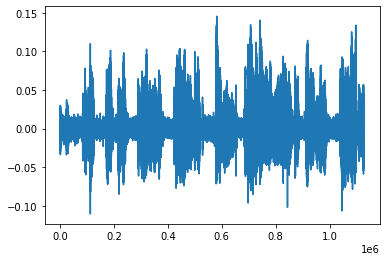

In [42]:
## cover signal
#clip = glob.glob(os.path.join(Folder,'FSDnoisy18k.audio_test/82929.wav'))[0]
clip = glob.glob(os.path.join(AUDIO_FOLDER, 'val/coco_val_185409_100.wav'))[0]
#clip = glob.glob(os.path.join(MY_FOLDER, 'notebooks/preamble10.wav'))[0]
cover=torchaudio.load(clip)[0][0]
cover.shape
#cov = isdct_torch(cover.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)
plt.plot(cover)

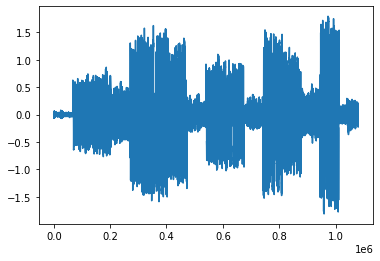

In [58]:
#container signal
plt.plot(container_wav_total)
#cov = isdct_torch(cover.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)
#plt.plot(cov)

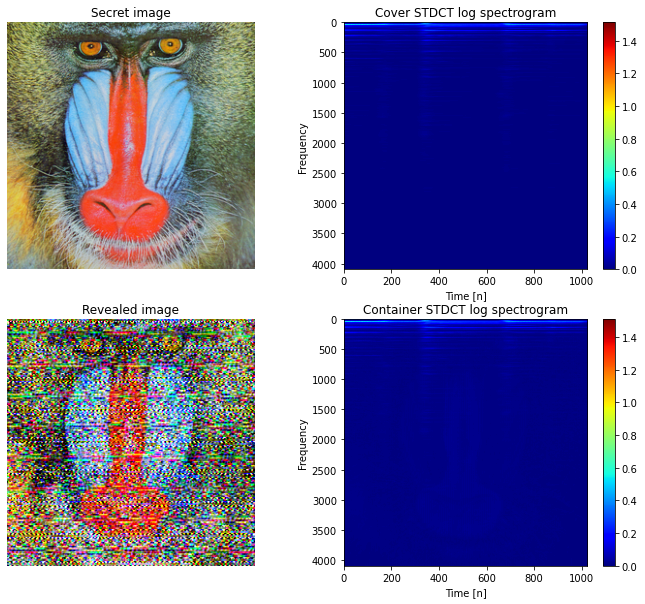

In [110]:
viz2paper(secret, revealed, cover, container)

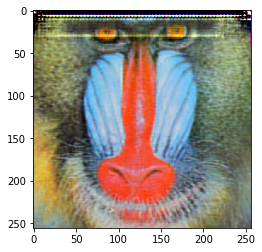

In [57]:
plot_image(revealed_total)

In [81]:
psnr_image = PSNR(secret, revealed)
ssim_image = ssim(secret, revealed)
print(psnr_image,ssim_image)

tensor(-39.8554) tensor(0.6952)


**LOAD CHECKPOINT**

In [108]:
model = StegoUNet(
    transform='cosine',
    add_noise= True, 
    noise_kind='gaussian', 
    noise_amplitude=[0.9]
)
old_chk_PATH = '/mnt/gpid07/imatge/jaume.ros.alonso/PixInWav/logs/models'
checkpoint = torch.load('/imatge/cristina.punti/PixInWav/checkpoints/checkpoint_run_25.pt',map_location='cpu')
#checkpoint = torch.load('/imatge/teresa.domenech/venv/PixInWav/models/checkpoint_run_24.pt',map_location='cpu')
#checkpoint = torch.load(os.path.join(old_chk_PATH, 'checkpoint_run_114.pt'), map_location='cpu')
model = nn.DataParallel(model)
model.load_state_dict(checkpoint['state_dict'])
#model.load_state_dict(checkpoint)
print('Checkpoint loaded ++')

Checkpoint loaded ++


**LOAD CHECKPOINT FOR NOISE TRAINING**

In [50]:
from collections import OrderedDict
model = StegoUNet(
    transform='fourier',
    add_noise=True, 
    noise_kind='gaussian', 
    noise_amplitude=[1000]
)

# Load checkpoint
checkpoint = torch.load('/imatge/teresa.domenech/venv/PixInWav/models/checkpoint_run_121.pt',map_location='cpu')
#checkpoint = torch.load(os.path.join(old_chk_PATH, 'checkpoint_run_114.pt'), map_location='cpu')
substring1 = 'module.stft.forward_basis'
substring2 = 'module.stft.inverse_basis'
substring3 = 'stft.forward_basis'
substring4 = 'stft.inverse_basis'
checkpoint_tmp = OrderedDict()
substring = 'module.'
chp_sd = checkpoint['state_dict']
for k in chp_sd:
    new_k = k[len(substring):] if (k == substring1 or k == substring2) else k
    if new_k == substring3:
        break
    checkpoint_tmp[new_k] = chp_sd[k]
checkpoint['state_dict'] = checkpoint_tmp
print('Workaround loader')
model = nn.DataParallel(model)
model.load_state_dict(checkpoint['state_dict'])
print('Checkpoint loaded ++')

Workaround loader
Checkpoint loaded ++


In [65]:
from collections import OrderedDict
model = StegoUNet(
    transform='cosine',
    add_noise=True, 
    noise_kind='gaussian', 
    noise_amplitude=[0.9]
)

# Load checkpoint
#checkpoint = torch.load('/imatge/teresa.domenech/venv/PixInWav/models/checkpoint_run_1177.pt',map_location='cpu')
checkpoint = torch.load(os.path.join(old_chk_PATH, 'checkpoint_run_114.pt'), map_location='cpu')
substring = 'module.'
checkpoint_tmp = OrderedDict()
chp_sd = checkpoint['state_dict']
for k in chp_sd:
    new_k = k[len(substring):] if k.startswith(substring) else k
    checkpoint_tmp[new_k] = chp_sd[k]
checkpoint['state_dict'] = checkpoint_tmp
print('Workaround loader')
model = nn.DataParallel(model)
model.load_state_dict(checkpoint['state_dict'])
print('Checkpoint loaded ++')

Workaround loader
Checkpoint loaded ++


In [15]:
epoch = checkpoint['epoch']
print(epoch)

ssim_v = checkpoint['vd_ssim']
psnr_v = checkpoint['vd_psnr']
snr_v = checkpoint['vd_snr']

ssim = checkpoint['tr_ssim']
psnr = checkpoint['tr_psnr']
snr = checkpoint['tr_snr']

ssim_v = np.mean(ssim_v[:])
psnr_v = np.mean(psnr_v[:])
snr_v = np.mean(snr_v[:])

ssim = np.mean(ssim[:])
psnr = np.mean(psnr[:])
snr = np.mean(snr[:])

print('epochs', epoch)
print('SSIM' ,ssim, 'PSNR', psnr, 'SNR', snr, 'SSIM_v', ssim_v, 'PSNR_val', psnr_v, 'SNR_v', snr_v)

2
epochs 2
SSIM 0.7705380443264457 PSNR 22.729019576427984 SNR 2.581442635355852 SSIM_v 0.7968015763574018 PSNR_val 23.592763253552707 SNR_v -2.326960957556513


In [13]:
for key in checkpoint:
    print(key)

epoch
state_dict
best_loss
beta
lr
i


In [ ]:
cover = isdct_torch(cover.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)
plt.plot(cover)

In [ ]:
#ct= torch.ones((12,))
secret = secret.float()
model = model.float()
model = model.eval()
model = model.cuda()
with torch.no_grad():
    #for i in range(0,12):
    container, revealed = model(secret, cover)
    # ct=torch.cat((container.cpu(),ct),0)
container, revealed = container.cpu(), revealed.cpu()

In [11]:
def image(r, ct):
    r = r.permute(0,2,3,1).detach().numpy().squeeze(0)
    ct = ct.detach().numpy().squeeze(0).squeeze(0)
    r = np.clip(r * 255.0, 0, 255).astype(np.uint8)

    fig, ax = plt.subplots(1, 1, figsize=(12, 10))
    ax.imshow(r)
    ax.axis('off')
    
    fig2, ax2 = plt.subplots(1, 1, figsize=(12, 10))
    img1 = ax2.imshow(np.log(np.abs(ct)[:,] + 1), origin = 'upper', aspect = 'auto', cmap=plt.cm.get_cmap("jet"))
    ax2.set_xlabel('Time [n]')
    ax2.set_ylabel('Frequency')
    ax2.set_title('Container STDCT log spectrogram')

    plt.colorbar(img1, ax=ax2)
    plt.close('all')
    
    return fig, fig2

In [12]:
a, b = image(revealed, container)

In [39]:
def plot_image(r):
    r = r.permute(0,2,3,1).detach().numpy().squeeze(0)
    r = np.clip(r * 255.0, 0, 255).astype(np.uint8)
    plt.imshow(r)
    

In [55]:
def viz2paper(s, r, cv, ct, log=True):
    s = s.permute(0,2,3,1).detach().numpy().squeeze(0)
    r = r.permute(0,2,3,1).detach().numpy().squeeze(0)
    cv = cv.detach().numpy().squeeze(0).squeeze(0)
    ct = ct.detach().numpy().squeeze(0).squeeze(0)

    s = (s * 255.0).astype(np.uint8)
    r = np.clip(r * 255.0, 0, 255).astype(np.uint8)

    fig, ax = plt.subplots(2, 2, figsize=(12, 10))
    ax[0,0].imshow(s)
    ax[1,0].imshow(r)
    ax[0,0].set_title('Secret image')
    ax[1,0].set_title('Revealed image')
    ax[0,0].axis('off')
    ax[1,0].axis('off')

    if log:
        img1 = ax[0,1].imshow(np.log(np.abs(cv)[:,] + 1), origin = 'upper', aspect = 'auto', cmap=plt.cm.get_cmap("jet"))
        ax[0,1].set_title('Cover STDCT log spectrogram')
        img2 = ax[1,1].imshow(np.log(np.abs(ct)[:,] + 1), origin = 'upper', aspect = 'auto', cmap=plt.cm.get_cmap("jet"))
        ax[1,1].set_title('Container STDCT log spectrogram')
    else:
        img1 = ax[0,1].imshow(np.abs(cv) [:,], origin = 'upper', aspect = 'auto', cmap=plt.cm.get_cmap("jet"))
        ax[0,1].set_title('Cover STDCT spectrogram')
        img2 = ax[1,1].imshow(np.abs(ct)[:,], origin = 'upper', aspect = 'auto', cmap=plt.cm.get_cmap("jet"))
        ax[1,1].set_title('Container STDCT spectrogram')

    ax[0,1].set_xlabel('Time [n]')
    ax[0,1].set_ylabel('Frequency')
    ax[1,1].set_xlabel('Time [n]')
    ax[1,1].set_ylabel('Frequency')

    plt.colorbar(img1, ax=ax[0,1])
    plt.colorbar(img2, ax=ax[1,1])
    plt.close('all')

    return fig

**Validation noise results**

In [34]:
test_loader = loader(
    set='test',
    rgb=True,
    transform='fourier',
)

Preparing dataset...
IMAGE DATA LOCATED AT: /mnt/gpid08/datasets/ILSVRC/ILSVRC2012/train
AUDIO DATA LOCATED AT: /mnt/gpid07/imatge/cristina.punti/PixInWav/data/FSDnoisy18k.audio_test
Set up done
Dataset prepared.
Data loaded ++


In [51]:
import time
def validate(model, vd_loader, beta, transform='fourier', transform_constructor=None, on_phase=False, dtw_criterion=None,
             epoch=None, tr_i=None, verbose=False):
    # Set device
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f'Using device: {device}')

    # Parallelize on GPU
    if torch.cuda.device_count() > 1:
        print("Let's use", torch.cuda.device_count(), "GPUs!")
        model = nn.DataParallel(model)

    model.to(device)

    # Set to evaluation mode
    model.eval()
    loss = 0

    valid_loss, valid_loss_cover, valid_loss_secret, valid_loss_spectrum, valid_snr, valid_psnr, valid_ssim, valid_dtw = [], [], [], [], [], [], [], []
    vd_datalen = len(vd_loader)

    # Start validating ...
    iniv = time.time()
    with torch.no_grad():
        print('Validating current model...')
        for i, data in enumerate(vd_loader):
            print(f'Image {i}')
            secrets, covers = data[0].to(device), data[1].to(device)
            secrets = secrets.permute(0, 3, 1, 2).type(torch.cuda.FloatTensor)
            if transform == 'fourier': phase = data[2].to(device)
            covers = covers.unsqueeze(1) if transform == 'cosine' else covers

            if (transform == 'fourier') and (on_phase):
                containers, revealed = model(secrets, phase)
            else:
                containers, revealed = model(secrets, covers, phase) #canviar noise fourier

            if transform == 'cosine':
                container_wav = isdct_torch(containers.squeeze(0).squeeze(0), frame_length=4096, frame_step=62,
                                            window=torch.hamming_window)
                container_2x = sdct_torch(container_wav, frame_length=4096, frame_step=62,
                                          window=torch.hamming_window).unsqueeze(0).unsqueeze(0)
                loss, loss_cover, loss_secret, loss_spectrum = StegoLoss(secrets, covers, containers, container_2x,
                                                                         revealed, beta)
            elif transform == 'fourier':
                if on_phase:
                    container_wav = transform_constructor.inverse(covers.squeeze(1), containers.squeeze(1))
                    container_2x = transform_constructor.transform(container_wav)[0].unsqueeze(0)
                    loss, loss_cover, loss_secret, loss_spectrum = StegoLoss(secrets, phase, containers, container_2x,
                                                                             revealed, beta)
                else:
                    container_wav = transform_constructor.inverse(containers.squeeze(1), phase.squeeze(1))
                    container_2x = transform_constructor.transform(container_wav)[0].unsqueeze(0)
                    loss, loss_cover, loss_secret, loss_spectrum = StegoLoss(secrets, covers, containers, container_2x,
                                                                             revealed, beta)

            vd_snr_audio = SNR(
                covers,
                containers,
                phase=None if transform == 'cosine' else phase,
                transform=transform,
                transform_constructor=None if transform == 'cosine' else transform_constructor,
                on_phase=on_phase
            )
            vd_psnr_image = PSNR(secrets, revealed)
            ssim_image = ssim(secrets, revealed)

            if dtw_criterion is not None:
                if transform == 'cosine':
                    original_wav = isdct_torch(covers.squeeze(0).squeeze(0), frame_length=4096, frame_step=62,
                                               window=torch.hamming_window)
                elif transform == 'fourier':
                    original_wav = transform_constructor.inverse(covers.squeeze(1), phase.squeeze(1))
                dtw_loss = dtw_criterion(original_wav.cpu().unsqueeze(0), container_wav.cpu().unsqueeze(0))
                if transform == 'fourier': dtw_loss = dtw_loss[0]

            valid_loss.append(loss.detach().item())
            valid_loss_cover.append(loss_cover.detach().item())
            valid_loss_secret.append(loss_secret.detach().item())
            valid_loss_spectrum.append(loss_spectrum.detach().item())
            valid_snr.append(vd_snr_audio)
            valid_psnr.append(vd_psnr_image.detach().item())
            valid_ssim.append(ssim_image.detach().item())
            valid_dtw.append(dtw_loss.detach().item())

            if i >= 500: break
        # if i >= vd_datalen: break

        avg_valid_loss = np.mean(valid_loss)
        avg_valid_loss_cover = np.mean(valid_loss_cover)
        avg_valid_loss_secret = np.mean(valid_loss_secret)
        avg_valid_loss_spectrum = np.mean(valid_loss_spectrum)
        avg_valid_snr = np.mean(valid_snr)
        avg_valid_psnr = np.mean(valid_psnr)
        avg_valid_ssim = np.mean(valid_ssim)
        avg_valid_dtw = np.mean(valid_dtw)

        print(
            f'(#{i})[{np.round(time.time()-iniv,2)}s]\
            Valid Loss {avg_valid_loss},\
            cover_error {avg_valid_loss_cover},\
            secret_error {avg_valid_loss_secret},\
            spectrum_error {avg_valid_loss_spectrum},\
            SNR {avg_valid_snr},\
            PSNR {avg_valid_psnr},\
            SSIM {avg_valid_ssim},\
            DTW {avg_valid_dtw}'
        )
        print(f"Validation took {time.time() - iniv} seconds")

    del valid_loss
    del valid_loss_cover
    del valid_loss_secret
    del valid_loss_spectrum
    del valid_snr
    del valid_psnr
    del valid_ssim
    del valid_dtw


In [52]:
import numpy as np
import torch
from numba import jit
from torch.autograd import Function

@jit(nopython = True)
def compute_softdtw(D, gamma):
  B = D.shape[0]
  N = D.shape[1]
  M = D.shape[2]
  R = np.ones((B, N + 2, M + 2)) * np.inf
  R[:, 0, 0] = 0
  for k in range(B):
    for j in range(1, M + 1):
      for i in range(1, N + 1):
        r0 = -R[k, i - 1, j - 1] / gamma
        r1 = -R[k, i - 1, j] / gamma
        r2 = -R[k, i, j - 1] / gamma
        rmax = max(max(r0, r1), r2)
        rsum = np.exp(r0 - rmax) + np.exp(r1 - rmax) + np.exp(r2 - rmax)
        softmin = - gamma * (np.log(rsum) + rmax)
        R[k, i, j] = D[k, i - 1, j - 1] + softmin
  return R

@jit(nopython = True)
def compute_softdtw_backward(D_, R, gamma):
  B = D_.shape[0]
  N = D_.shape[1]
  M = D_.shape[2]
  D = np.zeros((B, N + 2, M + 2))
  E = np.zeros((B, N + 2, M + 2))
  D[:, 1:N + 1, 1:M + 1] = D_
  E[:, -1, -1] = 1
  R[:, : , -1] = -np.inf
  R[:, -1, :] = -np.inf
  R[:, -1, -1] = R[:, -2, -2]
  for k in range(B):
    for j in range(M, 0, -1):
      for i in range(N, 0, -1):
        a0 = (R[k, i + 1, j] - R[k, i, j] - D[k, i + 1, j]) / gamma
        b0 = (R[k, i, j + 1] - R[k, i, j] - D[k, i, j + 1]) / gamma
        c0 = (R[k, i + 1, j + 1] - R[k, i, j] - D[k, i + 1, j + 1]) / gamma
        a = np.exp(a0)
        b = np.exp(b0)
        c = np.exp(c0)
        E[k, i, j] = E[k, i + 1, j] * a + E[k, i, j + 1] * b + E[k, i + 1, j + 1] * c
  return E[:, 1:N + 1, 1:M + 1]

class _SoftDTW(Function):
  @staticmethod
  def forward(ctx, D, gamma):
    dev = D.device
    dtype = D.dtype
    gamma = torch.Tensor([gamma]).to(dev).type(dtype) # dtype fixed
    D_ = D.detach().cpu().numpy()
    g_ = gamma.item()
    R = torch.Tensor(compute_softdtw(D_, g_)).to(dev).type(dtype)
    ctx.save_for_backward(D, R, gamma)
    return R[:, -2, -2]

  @staticmethod
  def backward(ctx, grad_output):
    dev = grad_output.device
    dtype = grad_output.dtype
    D, R, gamma = ctx.saved_tensors
    D_ = D.detach().cpu().numpy()
    R_ = R.detach().cpu().numpy()
    g_ = gamma.item()
    E = torch.Tensor(compute_softdtw_backward(D_, R_, g_)).to(dev).type(dtype)
    return grad_output.view(-1, 1, 1).expand_as(E) * E, None

class SoftDTW(torch.nn.Module):
  def __init__(self, gamma=1.0, normalize=False):
    super(SoftDTW, self).__init__()
    self.normalize = normalize
    self.gamma=gamma
    self.func_dtw = _SoftDTW.apply

  def calc_distance_matrix(self, x, y):
    n = x.size(1)
    m = y.size(1)
    d = x.size(2)
    x = x.unsqueeze(2).expand(-1, n, m, d)
    y = y.unsqueeze(1).expand(-1, n, m, d)
    dist = torch.pow(x - y, 2).sum(3)
    return dist

  def forward(self, x, y):
    assert len(x.shape) == len(y.shape)
    squeeze = False
    if len(x.shape) < 3:
      x = x.unsqueeze(0)
      y = y.unsqueeze(0)
      squeeze = True
    if self.normalize:
      D_xy = self.calc_distance_matrix(x, y)
      out_xy = self.func_dtw(D_xy, self.gamma)
      D_xx = self.calc_distance_matrix(x, x)
      out_xx = self.func_dtw(D_xx, self.gamma)
      D_yy = self.calc_distance_matrix(y, y)
      out_yy = self.func_dtw(D_yy, self.gamma)
      result = out_xy - 1/2 * (out_xx + out_yy) # distance
    else:
      D_xy = self.calc_distance_matrix(x, y)
      out_xy = self.func_dtw(D_xy, self.gamma)
      result = out_xy # discrepancy
    return result.squeeze(0) if squeeze else result

In [53]:
softDTW = SoftDTW(gamma=1.0, normalize=True) 
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
stft = STFT(filter_length=2 ** 11 - 1,
            hop_length=132,
            win_length=2 ** 11 - 1,
            window='hann').to(device)
stft.num_samples = 67522
validate(model, test_loader, beta=0.5, transform='fourier', dtw_criterion=softDTW, transform_constructor=stft)

Using device: cuda
Validating current model...
Image 0
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 1
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 2
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 3
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 4
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 5
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 6
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 7
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 8
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 9
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 10
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 11
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 12
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 13
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 14
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 15
ENTRAAAAAA
gaussian [1000]
torch.Size([1, 67522])
Image 16
ENTRAAAAAA

**Results modifying beta parameter**

beta 0.05 0.1 0.5 0.75 0.9
chk 103 105 110 111 116
imatge baboon
audio loc narr test
FT

In [9]:
#chk = ['checkpoint_run_111.pt', 'checkpoint_run_112.pt', 'checkpoint_run_114.pt', 'checkpoint_run_122.pt', 'checkpoint_run_125.pt']
chk = ['checkpoint_run_103.pt', 'checkpoint_run_105.pt', 'checkpoint_run_110.pt', 'checkpoint_run_111.pt', 'checkpoint_run_116.pt']

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


checkpoint_run_103.pt


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


checkpoint_run_105.pt


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


checkpoint_run_110.pt


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


checkpoint_run_111.pt


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


checkpoint_run_116.pt


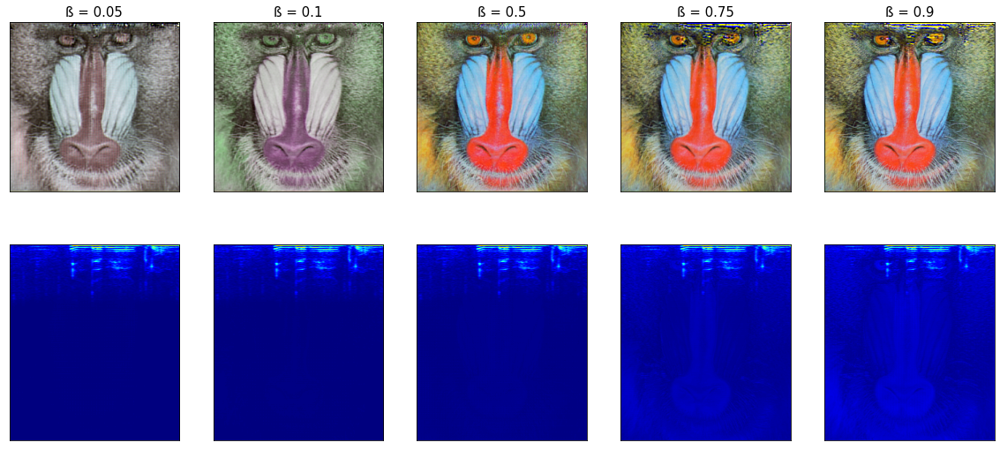

In [15]:
import matplotlib
from collections import OrderedDict

SMALL_SIZE = 15
old_chk_PATH = '/mnt/gpid07/imatge/jaume.ros.alonso/PixInWav/logs/models'
matplotlib.rc('font', size=SMALL_SIZE)
matplotlib.rc('axes', titlesize=SMALL_SIZE)
index_image = 3
fig, ax = plt.subplots(nrows=2, ncols=5, figsize=(20,9))
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=None, hspace=None)
beta = [0.05, 0.1, 0.5, 0.75, 0.9]

clip = glob.glob(os.path.join(AUDIO_FOLDER, 'val/coco_val_250282_24.wav'))[0]
#clip = 'music.wav'
audioPr = AudioProcessor(transform='fourier')
cover, phase = audioPr.forward(clip)
cover, phase = cover.unsqueeze(0), phase.unsqueeze(0)
stft = STFT(filter_length=2 ** 11 - 1,
            hop_length=132,
            win_length=2 ** 11 - 1,
            window='hann')
stft.num_samples = 67522

secret = torch.Tensor(ImageProcessor(image_path='baboon.png').forward()).unsqueeze(0).permute(0,3,1,2)

for i in range(4 + 1):
    ax[0,i].set_xticks([])
    ax[0,i].set_yticks([])
    ax[1,i].set_xticks([])
    ax[1,i].set_yticks([])
    #ax[2,i].set_xticks([])
    #ax[2,i].set_yticks([])
    '''
    if i == 0:
        #aixo es per si vols la primera imatge que sigui l'original
        revealed = secret.float()
        container = cover
        ax[0,i].set_title('Original')
        ax[0,i].set_ylabel('Image')
        ax[1,i].set_ylabel('STDCT log spectrogram')
        #ax[2,i].set_ylabel('Waveform')
    '''
    #else:
    model = StegoUNet(
            transform='fourier',
            add_noise=False, 
            noise_kind=None, 
            noise_amplitude=0
    )
    checkpoint = torch.load(os.path.join(MY_FOLDER, f'models/{chk[i]}'), map_location='cpu')
    '''
    if i<3:
        checkpoint = torch.load(os.path.join(old_chk_PATH, chk[i]), map_location='cpu')
        substring = 'module.'
        checkpoint_tmp = OrderedDict()
        chp_sd = checkpoint['state_dict']
        for k in chp_sd:
            new_k = k[len(substring):] if k.startswith(substring) else k
            checkpoint_tmp[new_k] = chp_sd[k]
        checkpoint['state_dict'] = checkpoint_tmp
    else:
        checkpoint = torch.load(os.path.join(MY_FOLDER, f'models/{chk[i]}'), map_location='cpu')
    '''    
    print(chk[i])
    model = nn.DataParallel(model)
    model.load_state_dict(checkpoint['state_dict'])

    secret = secret.float()
    model = model.float()
    model = model.eval()
    with torch.no_grad():
        container, revealed = model(secret, cover)
    container, revealed = container.cpu(), revealed.cpu()
    ax[0,i].set_title(f'ß = {beta[i]}')
    ax[0,i].imshow(revealed.permute(0,2,3,1).squeeze(0))
    ax[1,i].imshow(np.log(np.abs(container.squeeze(0).squeeze(0))[:,] + 1), origin = 'upper', aspect = 'auto', cmap=plt.cm.get_cmap("jet"))
    #container_wav = isdct_torch(container.squeeze(0).squeeze(0), frame_length=4096, frame_step=62, window=torch.hamming_window)
    container_wav = audioPr.stft.inverse(container.squeeze(1), phase.squeeze(1)).cpu().data.numpy()[..., :].squeeze(0)
    #ax[2,i].plot(container_wav)
    #ax[1,i].set_ylim((-1.5,1.5))
    #ax[2,i].spines['right'].set_visible(False)
    #ax[2,i].spines['bottom'].set_visible(False)
    #ax[2,i].spines['left'].set_visible(False)
    #ax[2,i].spines['top'].set_visible(False)
plt.show()

**Per trobar parella imatge audio**

In [32]:
clip = glob.glob(os.path.join(MY_FOLDER, 'PixInWav_dataset/train/coco_val_100428_36.wav'))[0]
path_image = '/mnt/gpid08/datasets/coco-2017/coco/images/val2017/*.jpg'
images = glob.glob(path_image)

audio_name = clip.split('/')[9]
image_id = audio_name.split('_')[2]
for i in images:
    img = i.split('/')[8]
    img=img.split('.')[0]
    img=int(img)
    if int(image_id) == img:
        print('find',image_id, i)

find 100428 /mnt/gpid08/datasets/coco-2017/coco/images/val2017/000000100428.jpg
